# Eye Gaze Analysis: Scanpath & Heatmap Visualization

This notebook:
1. Loads normalized eye gaze data (X/Y proportions 0–1)
2. Converts proportions → pixel coordinates using each image's actual size
3. Draws a **heatmap** overlaid on the image
4. Draws a **scanpath** overlaid on the image

> **Folder structure expected:**
> ```
> project/
>   ├── eye_gaze_visualization.ipynb   ← this notebook
>   ├── gaze_data.csv                  ← your CSV file
>   └── Images/                        ← folder with image files
>         ├── 5c61db80-....png
>         ├── 1793e4df-....png
>         └── ...
> ```

## 1 · Imports & Configuration

In [1]:

import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
from scipy.ndimage import gaussian_filter
from PIL import Image

# ── USER SETTINGS ────────────────────────────────────────────────────────────
CSV_PATH    = "CSVLoggers/6_20260527_154521_gaze.csv"           # path to your CSV file
IMAGES_DIR  = "Assets/RX-Ray Images"                 # folder that contains the images

# Supported image extensions (tried in order)
IMAGE_EXTS  = [".png", ".jpg", ".jpeg", ".bmp", ".tiff", ".tif", ".dcm"]

# Heatmap gaussian blur radius (in pixels). Larger → smoother blob.
HEATMAP_SIGMA = 30

# Scanpath: circle size scales with fixation order
SCANPATH_MIN_DOT = 60    # scatter size for first fixation
SCANPATH_MAX_DOT = 200   # scatter size for last fixation

# Output folder for saved figures (set to None to skip saving)
OUTPUT_DIR = "output_figures"
# ─────────────────────────────────────────────────────────────────────────────

if OUTPUT_DIR:
    os.makedirs(OUTPUT_DIR, exist_ok=True)

print("Imports OK ✓")

Imports OK ✓


## 2 · Load & Inspect Gaze Data

In [2]:
df_raw = pd.read_csv(CSV_PATH)

# Strip leading/trailing spaces from column names
df_raw.columns = df_raw.columns.str.strip()

print(f"Loaded {len(df_raw):,} rows | Columns: {df_raw.columns.tolist()}")
df_raw.head()

Loaded 101,428 rows | Columns: ['UserID', 'Timestamp', 'SessionTime', 'ImageName', 'WindowLevel', 'WindowWidth', 'ZoomIn', 'ZoomOut', 'HeadGazeZ', 'HeadGazeY', 'HeadGazeZ.1', 'EyeGazeX', 'EyeGazeY', 'EyeGazeX (normalized)', 'EyeGazeY (normalized)', 'EyeGazeX (corrected)', 'EyeGazeY (corrected)']


,UserID,Timestamp,SessionTime,ImageName,WindowLevel,WindowWidth,ZoomIn,ZoomOut,HeadGazeZ,HeadGazeY,HeadGazeZ.1,EyeGazeX,EyeGazeY,EyeGazeX (normalized),EyeGazeY (normalized),EyeGazeX (corrected),EyeGazeY (corrected)
0,6,2026-05-27 15:45:31.664,1109.131,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.51,0.99,0.0,0.023367,-0.033214,1.083047,-0.023367,0.000000,0.000000,0.730566,0.414478,0.737469,0.465901
1,6,2026-05-27 15:45:31.678,1109.145,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.51,0.99,0.0,0.023385,-0.033239,1.083026,-0.023385,-0.117035,1.105441,0.730566,0.414478,0.737469,0.465901
2,6,2026-05-27 15:45:31.691,1109.158,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.51,0.99,0.0,0.023405,-0.033257,1.082986,-0.023405,-0.115232,1.111555,0.611073,0.518745,0.617976,0.570168
3,6,2026-05-27 15:45:31.705,1109.172,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.51,0.99,0.0,0.023452,-0.033265,1.082931,-0.023452,-0.114675,1.100320,0.612914,0.523907,0.619818,0.575330
4,6,2026-05-27 15:45:31.719,1109.186,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.51,0.99,0.0,0.023520,-0.033269,1.082898,-0.023520,-0.120784,1.114836,0.613483,0.514422,0.620386,0.565845


## 3 · Column Mapping

Adjust the names below if your CSV has different column headers.

In [3]:
# ── COLUMN NAMES ─────────────────────────────────────────────────────────────
COL_IMAGE   = "ImageName"                    # image identifier
COL_GAZE_X  = "EyeGazeX (normalized)"    # 0.0 – 1.0  (left → right)
COL_GAZE_Y  = "EyeGazeY (normalized)"    # 0.0 – 1.0  (top → bottom)
COL_TIME    = "Timestamp"                   # used to order fixations in scanpath
# ─────────────────────────────────────────────────────────────────────────────

# Keep only the columns we need and drop NaN gaze rows
df = df_raw[[COL_IMAGE, COL_GAZE_X, COL_GAZE_Y, COL_TIME]].copy()
df = df.dropna(subset=[COL_GAZE_X, COL_GAZE_Y])

# Clamp normalised values to [0, 1] just in case of minor drift
df[COL_GAZE_X] = df[COL_GAZE_X].clip(0.0, 1.0)
df[COL_GAZE_Y] = df[COL_GAZE_Y].clip(0.0, 1.0)

print(f"Unique images in CSV: {df[COL_IMAGE].nunique()}")
print(df[COL_IMAGE].value_counts())

Unique images in CSV: 9
ImageName
060cf092-fe76bdf7-19fee515-26cbef2c-5c16ba6f    14802
53ba5a31-2d6bda0a-abb7ad77-065a0f20-b4fa6b44    14143
cb1f25ef-87f09c2a-0f656ffe-f63022ab-8b305520    13714
a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3    11802
9c452d99-a2e14f15-8458865f-92178374-a9e29b76    11412
8afc3991-7ec1912b-b24d9633-3c4b0f57-17c0e8f4    10080
f79f46d3-74a520f1-3039fa3d-eef50e3d-a5ad3e59     9312
5c61db80-672e0874-ba236081-53d2f8ad-ab8d2efb     8206
1793e4df-5b1fd824-cb5d0f43-bc3531f4-40cf6c54     7957
Name: count, dtype: int64


## 4 · Discover Images on Disk & Build a Size Map

In [4]:
def find_image_file(image_name: str, images_dir: str, extensions: list) -> str | None:
    """
    Given a bare image name (without extension), search `images_dir` for a
    file whose stem matches. Returns the full path or None.
    """
    stem = os.path.splitext(image_name)[0]   # handle names that already have ext
    for ext in extensions:
        candidate = os.path.join(images_dir, stem + ext)
        if os.path.isfile(candidate):
            return candidate
    # Fallback: glob for anything starting with the stem
    matches = glob.glob(os.path.join(images_dir, stem + "*"))
    return matches[0] if matches else None


# Build dict: image_name → (width_px, height_px, file_path)
image_info = {}   # {image_name: {"path": str, "width": int, "height": int}}

missing = []
for name in df[COL_IMAGE].unique():
    path = find_image_file(name, IMAGES_DIR, IMAGE_EXTS)
    if path is None:
        missing.append(name)
        continue
    try:
        with Image.open(path) as img:
            w, h = img.size
        image_info[name] = {"path": path, "width": w, "height": h}
        print(f"  ✓  {os.path.basename(path):60s}  {w} × {h} px")
    except Exception as e:
        print(f"  ✗  Could not open {path}: {e}")
        missing.append(name)

if missing:
    print(f"\n⚠️  {len(missing)} image(s) not found in '{IMAGES_DIR}':")
    for m in missing:
        print(f"     {m}")
    print("\nMake sure the Images folder contains files named exactly as above (± extension).")
else:
    print(f"\nAll {len(image_info)} images found ✓")

  ✓  a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3.jpg              2544 × 3056 px
  ✓  53ba5a31-2d6bda0a-abb7ad77-065a0f20-b4fa6b44.jpg              3056 × 2544 px
  ✓  f79f46d3-74a520f1-3039fa3d-eef50e3d-a5ad3e59.jpg              2544 × 3056 px
  ✓  1793e4df-5b1fd824-cb5d0f43-bc3531f4-40cf6c54.jpg              3056 × 2544 px
  ✓  060cf092-fe76bdf7-19fee515-26cbef2c-5c16ba6f.jpg              1794 × 2021 px
  ✓  9c452d99-a2e14f15-8458865f-92178374-a9e29b76.jpg              2544 × 3056 px
  ✓  5c61db80-672e0874-ba236081-53d2f8ad-ab8d2efb.jpg              2544 × 3056 px
  ✓  cb1f25ef-87f09c2a-0f656ffe-f63022ab-8b305520.jpg              2544 × 3056 px
  ✓  8afc3991-7ec1912b-b24d9633-3c4b0f57-17c0e8f4.jpg              2544 × 3056 px

All 9 images found ✓


## 5 · Convert Normalised Proportions → Pixel Coordinates

In [5]:
def norm_to_pixels(df_img: pd.DataFrame, width: int, height: int) -> pd.DataFrame:
    """
    Convert normalised gaze (0–1) to pixel coordinates.

    Convention:
      X_norm = 0 → left edge  (pixel 0)
      X_norm = 1 → right edge (pixel width-1)
      Y_norm = 0 → top edge   (pixel 0)
      Y_norm = 1 → bottom edge (pixel height-1)
    """
    out = df_img.copy()
    out["px"] = (out[COL_GAZE_X] * (width  - 1)).round().astype(int)
    out["py"] = ((1.0 - out[COL_GAZE_Y]) * (height - 1)).round().astype(int)  # flip Y: (0,0) is bottom-left
    return out


# Apply conversion per image
frames = []
for name, info in image_info.items():
    subset = df[df[COL_IMAGE] == name].copy()
    subset = norm_to_pixels(subset, info["width"], info["height"])
    frames.append(subset)

df_px = pd.concat(frames).reset_index(drop=True)

print("Pixel coordinate preview:")
df_px[[COL_IMAGE, COL_GAZE_X, COL_GAZE_Y, "px", "py"]].head(10)

Pixel coordinate preview:


,ImageName,EyeGazeX (normalized),EyeGazeY (normalized),px,py
0,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.730566,0.414478,1858,1789
1,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.730566,0.414478,1858,1789
2,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.611073,0.518745,1554,1470
3,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.612914,0.523907,1559,1454
4,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.613483,0.514422,1560,1483
5,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.607245,0.526677,1544,1446
6,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.601699,0.521856,1530,1461
7,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.601167,0.526116,1529,1448
8,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.611889,0.527215,1556,1444
9,a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3,0.612074,0.527388,1557,1444


## 6 · Visualisation Helpers

In [6]:
# ── Heatmap style matching the medical eye-tracking look ────────────────────
# The image is tinted blue everywhere, then gaze density pushes through
# cyan → green → yellow → red (like the reference image on the right).
# We achieve this by compositing: blue-tinted image base + jet-style overlay.

# Colourmap: fully transparent at zero → cyan → yellow → red at peak density
HEATMAP_CMAP = LinearSegmentedColormap.from_list(
    "medical_gaze",
    [
        (0.00, (0.00, 0.00, 0.50, 0.00)),   # transparent (no gaze)
        (0.10, (0.00, 0.20, 0.80, 0.55)),   # dark blue, semi-transparent
        (0.30, (0.00, 0.70, 0.90, 0.65)),   # cyan
        (0.55, (0.10, 0.90, 0.20, 0.75)),   # green
        (0.75, (1.00, 1.00, 0.00, 0.85)),   # yellow
        (1.00, (1.00, 0.00, 0.00, 0.95)),   # red (peak gaze)
    ],
    N=512
)


def build_density_map(px_coords, py_coords, width: int, height: int,
                      sigma: float = 30) -> np.ndarray:
    """
    Create a 2-D Gaussian-blurred density map of gaze points.
    Returns a float32 array of shape (height, width), normalised to [0, 1].
    """
    canvas = np.zeros((height, width), dtype=np.float32)
    for x, y in zip(px_coords, py_coords):
        if 0 <= x < width and 0 <= y < height:
            canvas[y, x] += 1.0
    blurred = gaussian_filter(canvas, sigma=sigma)
    if blurred.max() > 0:
        blurred /= blurred.max()
    return blurred


def plot_heatmap(image_path: str, px: np.ndarray, py: np.ndarray,
                 width: int, height: int,
                 title: str = "Heatmap",
                 sigma: float = HEATMAP_SIGMA,
                 save_path: str | None = None):
    """
    Overlay a gaze heatmap on the image — medical style:
      • Image base is rendered with a blue tint
      • Gaze density is overlaid: transparent → cyan → green → yellow → red
    """
    density = build_density_map(px, py, width, height, sigma=sigma)

    # Load image and apply blue tint (blend toward dark blue)
    img_rgb = load_image_as_rgb(image_path).astype(np.float32) / 255.0
    blue_tint = np.array([0.05, 0.10, 0.45], dtype=np.float32)  # dark blue
    tint_strength = 0.55   # 0 = no tint, 1 = full blue
    img_tinted = img_rgb * (1 - tint_strength) + blue_tint * tint_strength
    img_tinted = np.clip(img_tinted, 0, 1)

    fig, ax = plt.subplots(figsize=(10, 10 * height / width))
    fig.patch.set_facecolor('black')
    ax.set_facecolor('black')

    # Draw blue-tinted base image
    ax.imshow(img_tinted, extent=[0, width, height, 0], aspect="equal")

    # Overlay gaze density with the medical colourmap
    hm = ax.imshow(density, cmap=HEATMAP_CMAP,
                   extent=[0, width, height, 0],
                   vmin=0, vmax=1, aspect="equal")

    cbar = fig.colorbar(hm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Relative gaze density", fontsize=11, color='white')
    cbar.ax.yaxis.set_tick_params(color='white')
    plt.setp(cbar.ax.yaxis.get_ticklabels(), color='white')

    ax.set_title(title, fontsize=13, fontweight="bold", pad=10, color='white')
    ax.set_xlabel("X (pixels)", fontsize=10, color='white')
    ax.set_ylabel("Y (pixels)", fontsize=10, color='white')
    ax.tick_params(colors='white')
    for spine in ax.spines.values():
        spine.set_edgecolor('white')
    ax.set_xlim(0, width)
    ax.set_ylim(height, 0)
    plt.tight_layout()

    if save_path:
        fig.savefig(save_path, dpi=150, bbox_inches="tight", facecolor='black')
        print(f"    Saved → {save_path}")
    plt.show()
    plt.close()


def plot_scanpath(image_path: str, px: np.ndarray, py: np.ndarray,
                  width: int, height: int,
                  title: str = "Scanpath",
                  save_path: str | None = None):
    """
    Draw scanpath (fixation order, connecting lines, numbered dots) on image.
    """
    n = len(px)
    sizes = np.linspace(SCANPATH_MIN_DOT, SCANPATH_MAX_DOT, n)
    colours = plt.cm.plasma(np.linspace(0.1, 0.9, n))

    fig, ax = plt.subplots(figsize=(10, 10 * height / width))
    ax.imshow(load_image_as_rgb(image_path), extent=[0, width, height, 0], aspect="equal")

    # Draw connecting lines
    ax.plot(px, py, color="white", linewidth=1.2, alpha=0.6, zorder=2)

    # Draw fixation dots
    sc = ax.scatter(px, py, s=sizes, c=colours, edgecolors="white",
                    linewidths=0.8, zorder=3, alpha=0.85)

    # Number every N-th fixation to avoid clutter
    label_step = max(1, n // 20)
    for i in range(0, n, label_step):
        ax.text(px[i] + 4, py[i] - 4, str(i + 1),
                color="white", fontsize=7, fontweight="bold",
                va="bottom", ha="left", zorder=4)

    # Colour bar to show temporal order
    sm = plt.cm.ScalarMappable(cmap="plasma",
                                norm=mcolors.Normalize(vmin=1, vmax=n))
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, fraction=0.03, pad=0.02)
    cbar.set_label("Fixation order (1 = first)", fontsize=11)

    ax.set_title(title, fontsize=13, fontweight="bold", pad=10)
    ax.set_xlabel("X (pixels)", fontsize=10)
    ax.set_ylabel("Y (pixels)", fontsize=10)
    ax.set_xlim(0, width)
    ax.set_ylim(height, 0)
    plt.tight_layout()

    if save_path:
        fig.savefig(save_path, dpi=150, bbox_inches="tight")
        print(f"    Saved → {save_path}")
    plt.show()
    plt.close()


print("Helper functions defined ✓")


Helper functions defined ✓


## 6b · Image Loader (colour-safe)

This function fixes the **green tint** that appears when OpenCV loads images in BGR order.
It also handles 16-bit grayscale and DICOM files.


load_image_as_rgb() defined ✓  (PIL-only, no OpenCV required)
Shape: (3056, 2544, 3) | dtype: uint8
R mean=126.7  G mean=126.7  B mean=126.7


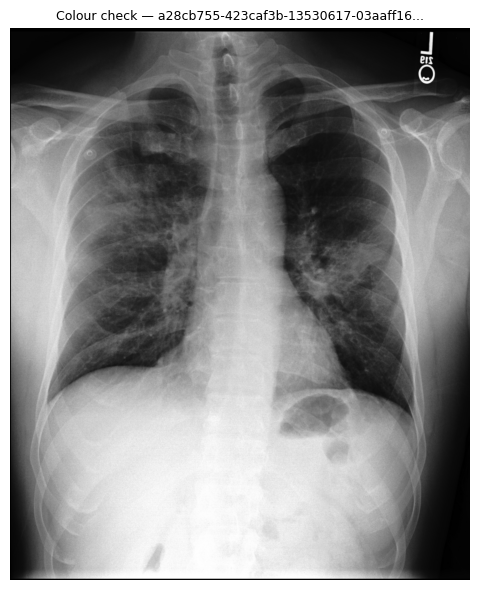

In [7]:
def load_image_as_rgb(path: str) -> "np.ndarray":
    """
    Load any image and return a uint8 RGB numpy array safe for matplotlib.
    Uses only PIL (no OpenCV needed).

    Handles:
      • Standard PNG/JPG/BMP/TIFF → converted to RGB
      • 16-bit grayscale (medical images) → scaled to 8-bit
      • Palette (P), RGBA, LA, L modes → converted to RGB
      • DICOM .dcm files → via pydicom (if installed), else skipped
    """
    ext = os.path.splitext(path)[1].lower()

    # ── DICOM ────────────────────────────────────────────────────────────────
    if ext == ".dcm":
        try:
            import pydicom
            ds = pydicom.dcmread(path)
            arr = ds.pixel_array.astype(np.float32)
            arr = (arr - arr.min()) / (arr.max() - arr.min() + 1e-8) * 255
            arr = arr.astype(np.uint8)
            if arr.ndim == 2:
                arr = np.stack([arr, arr, arr], axis=-1)
            return arr
        except ImportError:
            raise ImportError("Install pydicom to read .dcm files: pip install pydicom")

    # ── PIL path (all other formats) ─────────────────────────────────────────
    with Image.open(path) as img:
        # Handle 16-bit grayscale (I;16 or I mode) — scale to 8-bit
        if img.mode in ("I;16", "I;16B", "I"):
            arr = np.array(img, dtype=np.float32)
            arr = (arr - arr.min()) / (arr.max() - arr.min() + 1e-8) * 255
            img = Image.fromarray(arr.astype(np.uint8), mode="L")

        # Convert everything to RGB (handles L, LA, P, RGBA, CMYK, etc.)
        img = img.convert("RGB")
        return np.array(img)


print("load_image_as_rgb() defined ✓  (PIL-only, no OpenCV required)")

# Quick colour sanity-check on the first image
if image_info:
    sample_name, sample_info = next(iter(image_info.items()))
    sample_arr = load_image_as_rgb(sample_info["path"])
    print(f"Shape: {sample_arr.shape} | dtype: {sample_arr.dtype}")
    print(f"R mean={sample_arr[...,0].mean():.1f}  "
          f"G mean={sample_arr[...,1].mean():.1f}  "
          f"B mean={sample_arr[...,2].mean():.1f}")
    fig, ax = plt.subplots(figsize=(5, 5 * sample_info['height'] / sample_info['width']))
    ax.imshow(sample_arr)
    ax.set_title(f"Colour check — {sample_name[:35]}...", fontsize=9)
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    plt.close()


## 7 · Generate Heatmap for Every Image


🔥  Heatmap — a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3  (2544×3056 px, 11802 gaze points)
    Saved → output_figures\a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3_heatmap.png


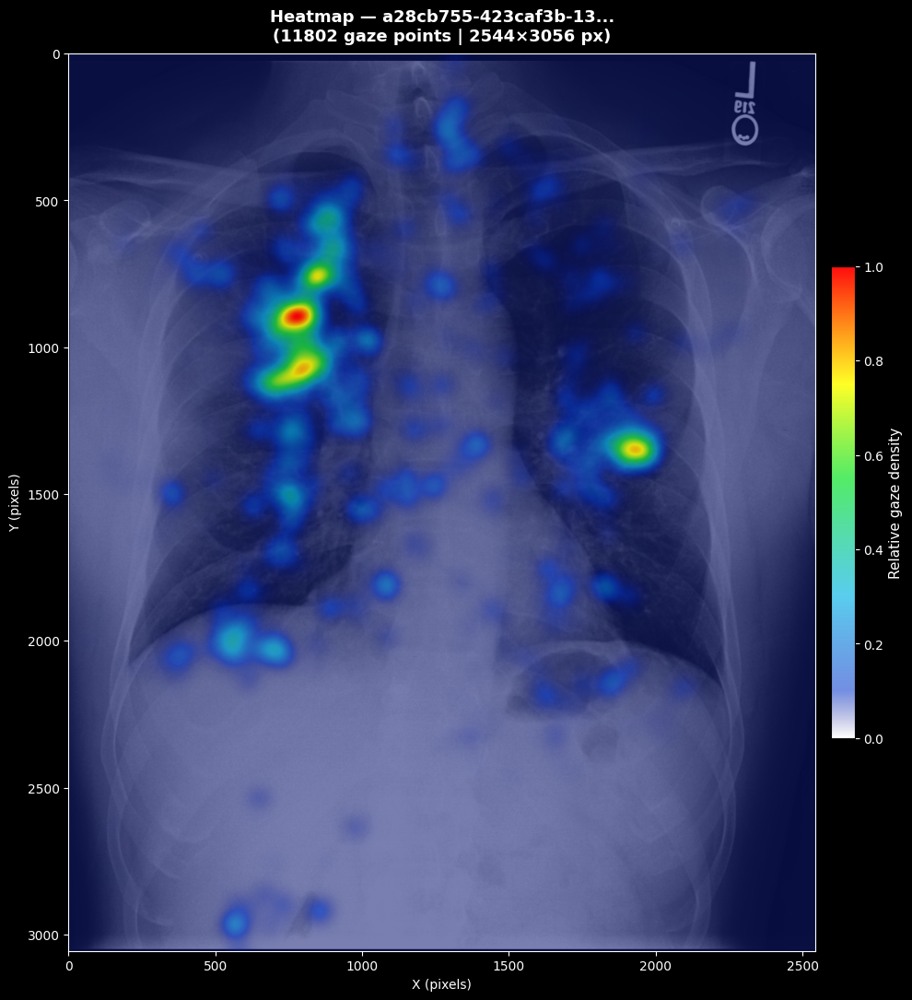


🔥  Heatmap — 53ba5a31-2d6bda0a-abb7ad77-065a0f20-b4fa6b44  (3056×2544 px, 14143 gaze points)
    Saved → output_figures\53ba5a31-2d6bda0a-abb7ad77-065a0f20-b4fa6b44_heatmap.png


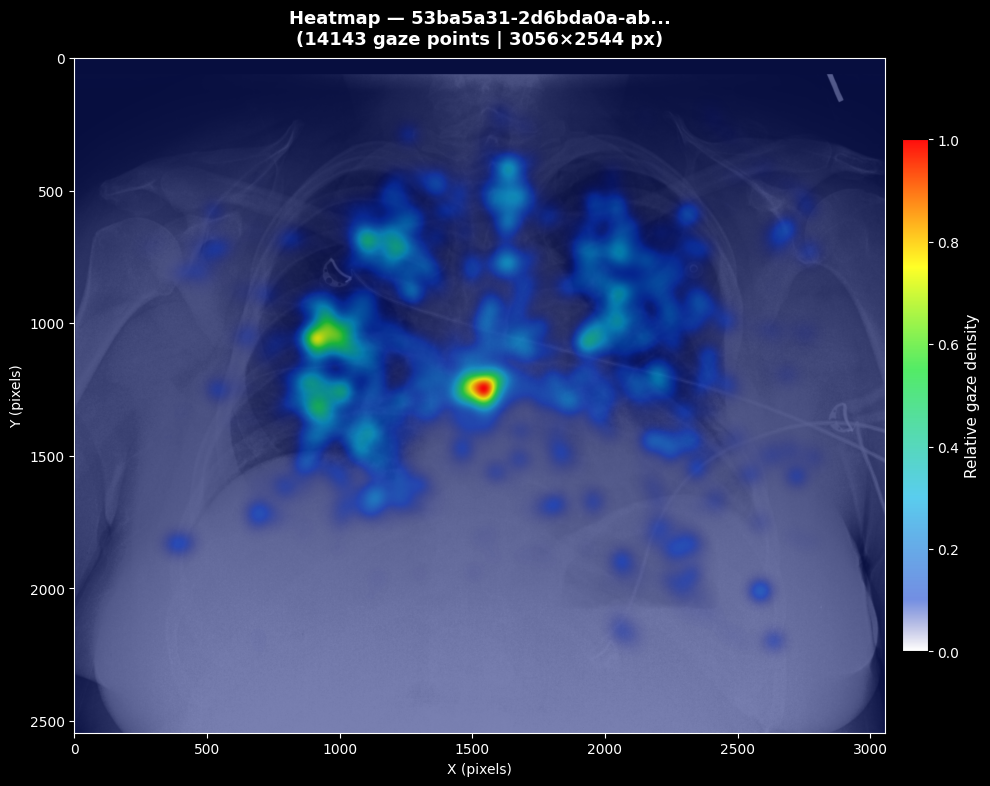


🔥  Heatmap — f79f46d3-74a520f1-3039fa3d-eef50e3d-a5ad3e59  (2544×3056 px, 9312 gaze points)
    Saved → output_figures\f79f46d3-74a520f1-3039fa3d-eef50e3d-a5ad3e59_heatmap.png


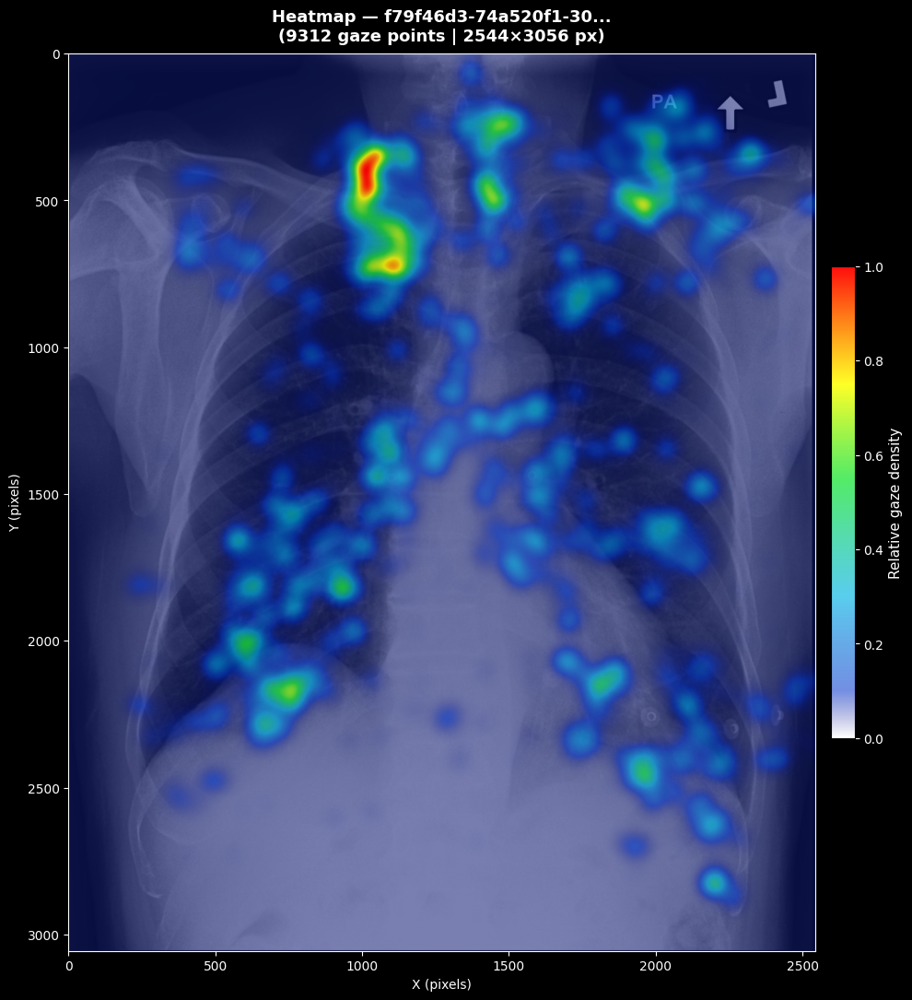


🔥  Heatmap — 1793e4df-5b1fd824-cb5d0f43-bc3531f4-40cf6c54  (3056×2544 px, 7957 gaze points)
    Saved → output_figures\1793e4df-5b1fd824-cb5d0f43-bc3531f4-40cf6c54_heatmap.png


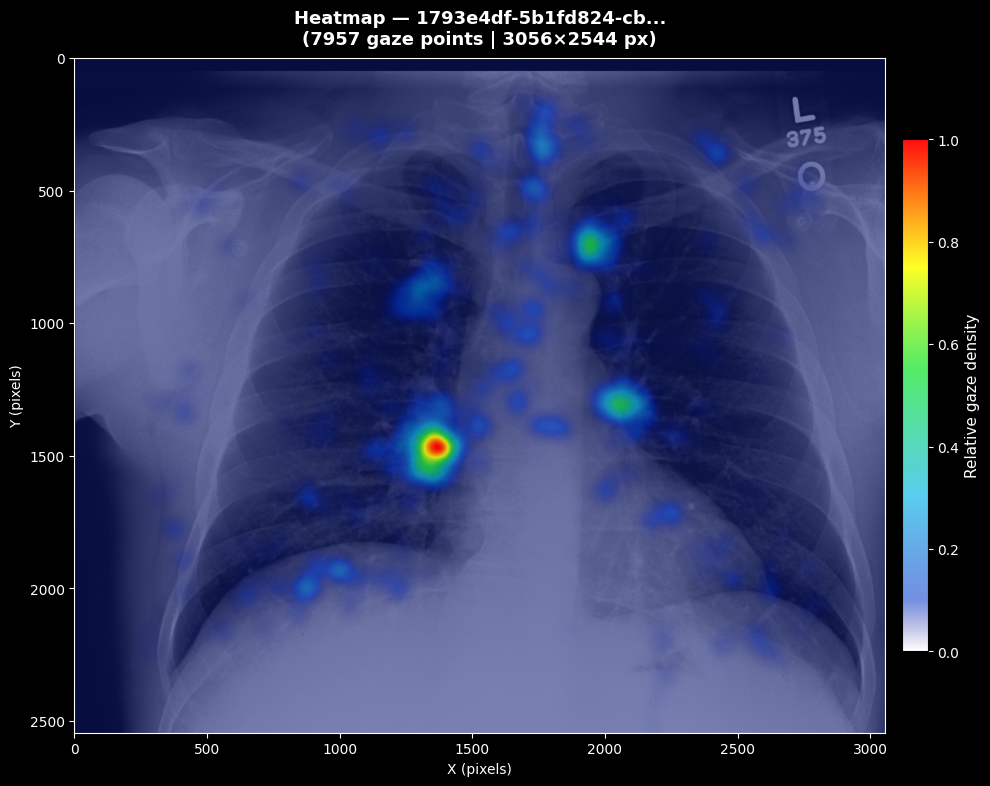


🔥  Heatmap — 060cf092-fe76bdf7-19fee515-26cbef2c-5c16ba6f  (1794×2021 px, 14802 gaze points)
    Saved → output_figures\060cf092-fe76bdf7-19fee515-26cbef2c-5c16ba6f_heatmap.png


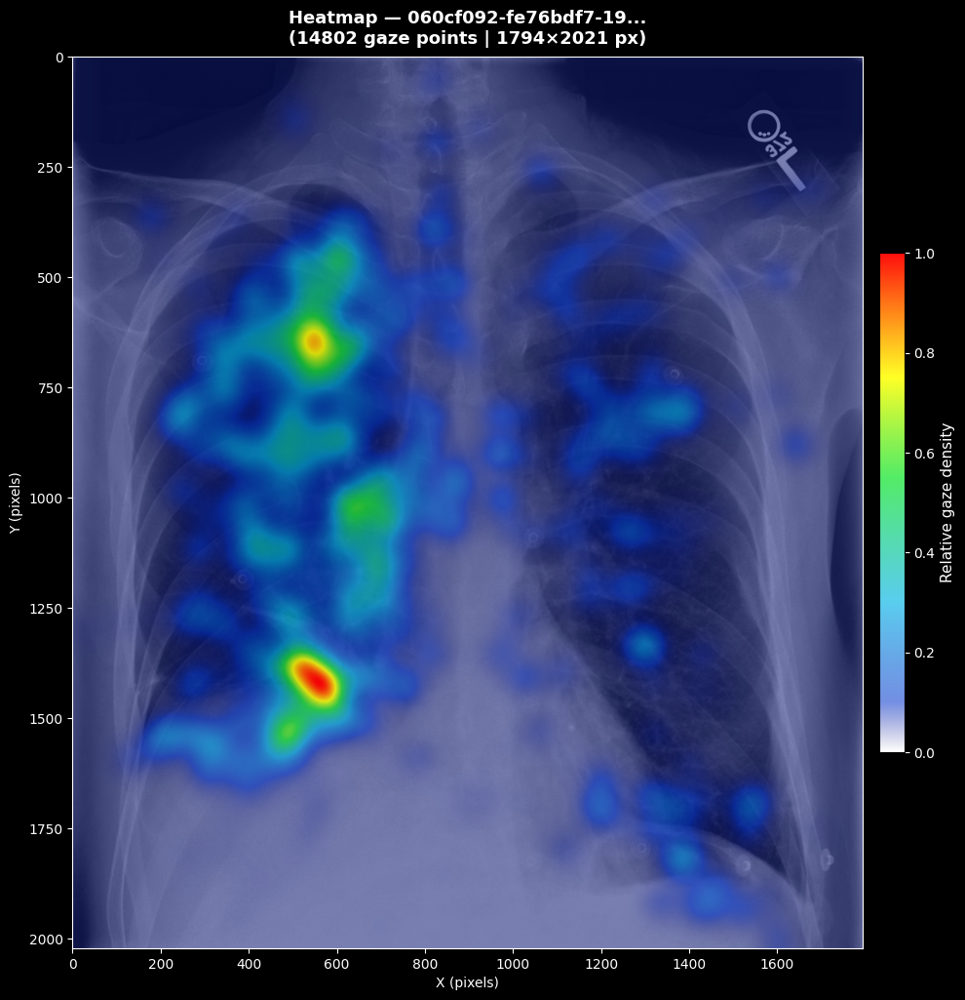


🔥  Heatmap — 9c452d99-a2e14f15-8458865f-92178374-a9e29b76  (2544×3056 px, 11412 gaze points)
    Saved → output_figures\9c452d99-a2e14f15-8458865f-92178374-a9e29b76_heatmap.png


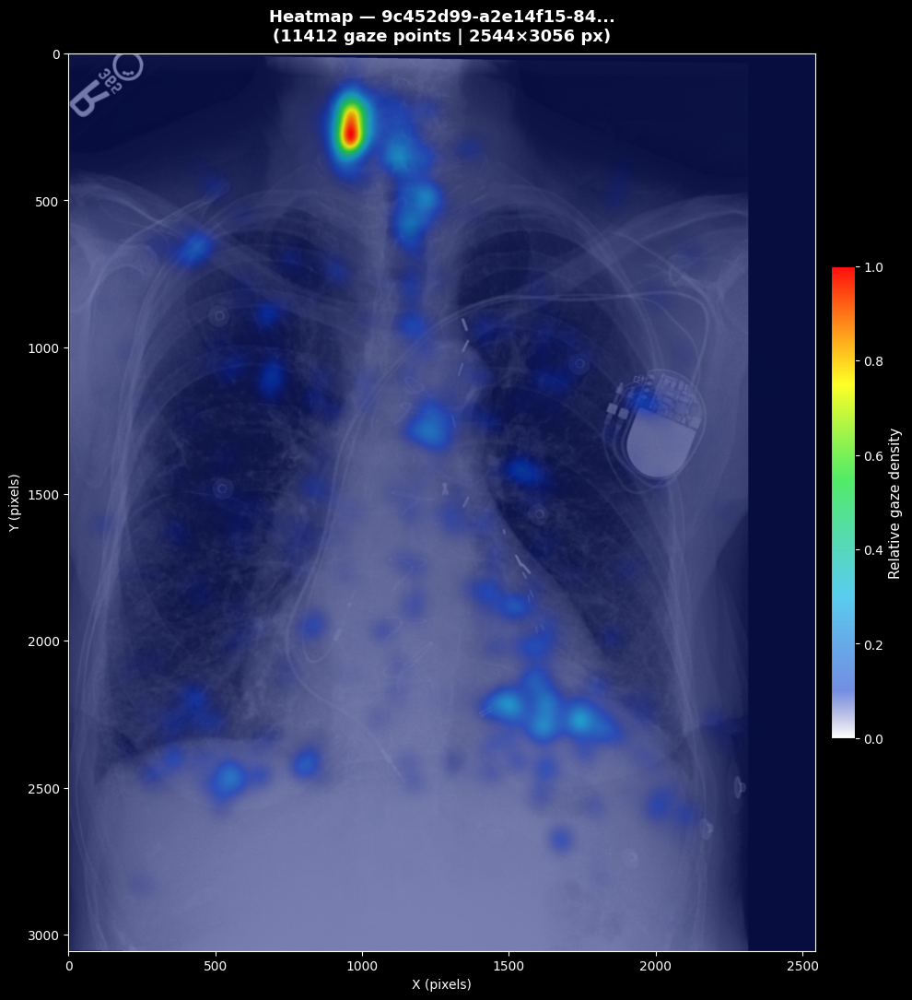


🔥  Heatmap — 5c61db80-672e0874-ba236081-53d2f8ad-ab8d2efb  (2544×3056 px, 8206 gaze points)
    Saved → output_figures\5c61db80-672e0874-ba236081-53d2f8ad-ab8d2efb_heatmap.png


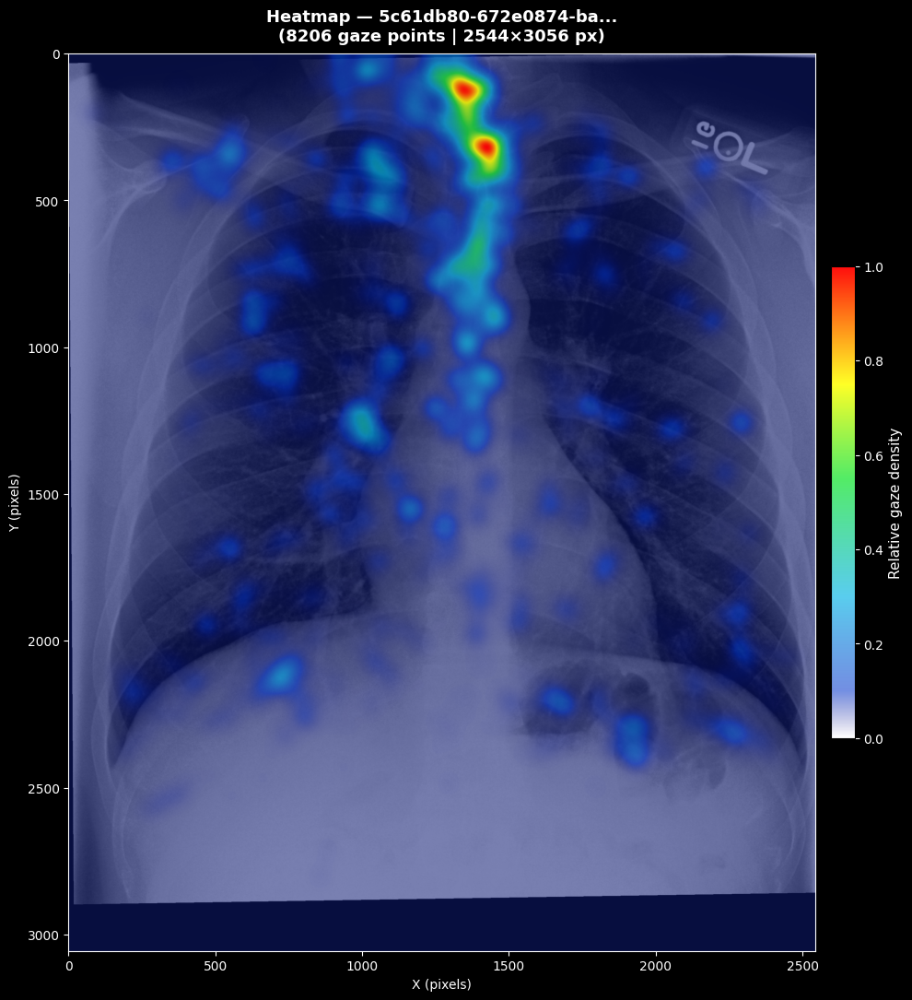


🔥  Heatmap — cb1f25ef-87f09c2a-0f656ffe-f63022ab-8b305520  (2544×3056 px, 13714 gaze points)
    Saved → output_figures\cb1f25ef-87f09c2a-0f656ffe-f63022ab-8b305520_heatmap.png


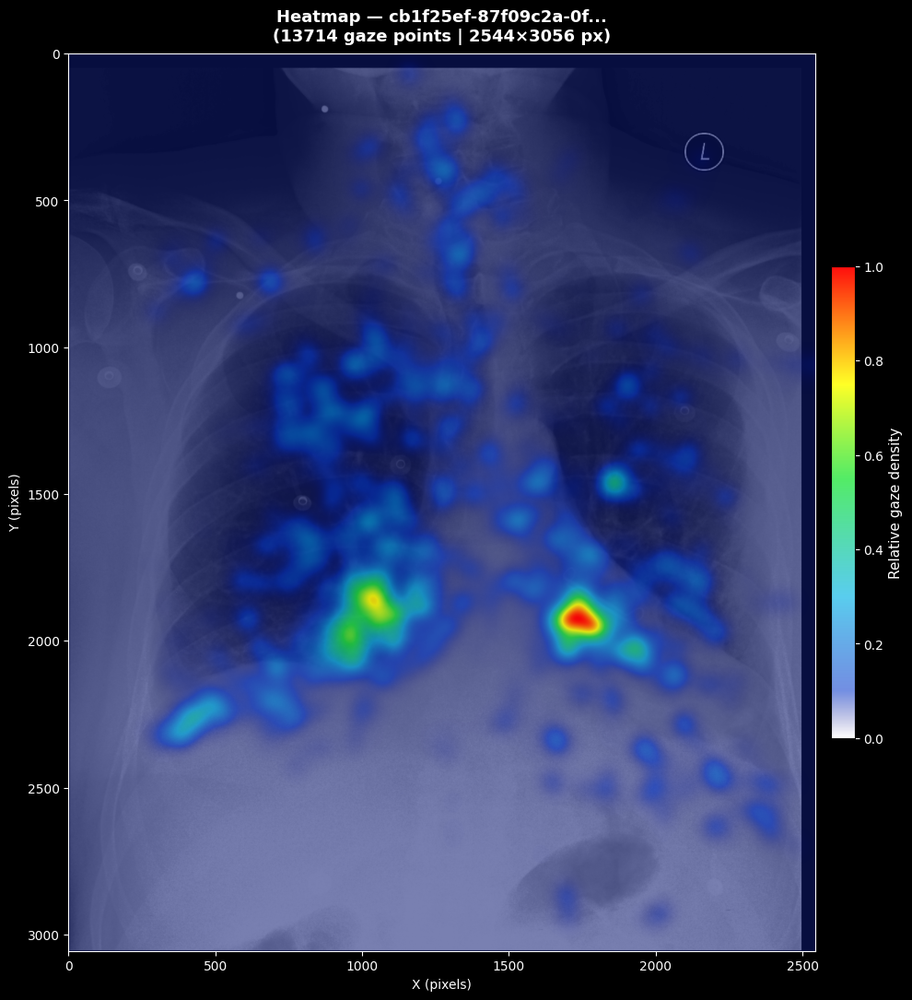


🔥  Heatmap — 8afc3991-7ec1912b-b24d9633-3c4b0f57-17c0e8f4  (2544×3056 px, 10080 gaze points)
    Saved → output_figures\8afc3991-7ec1912b-b24d9633-3c4b0f57-17c0e8f4_heatmap.png


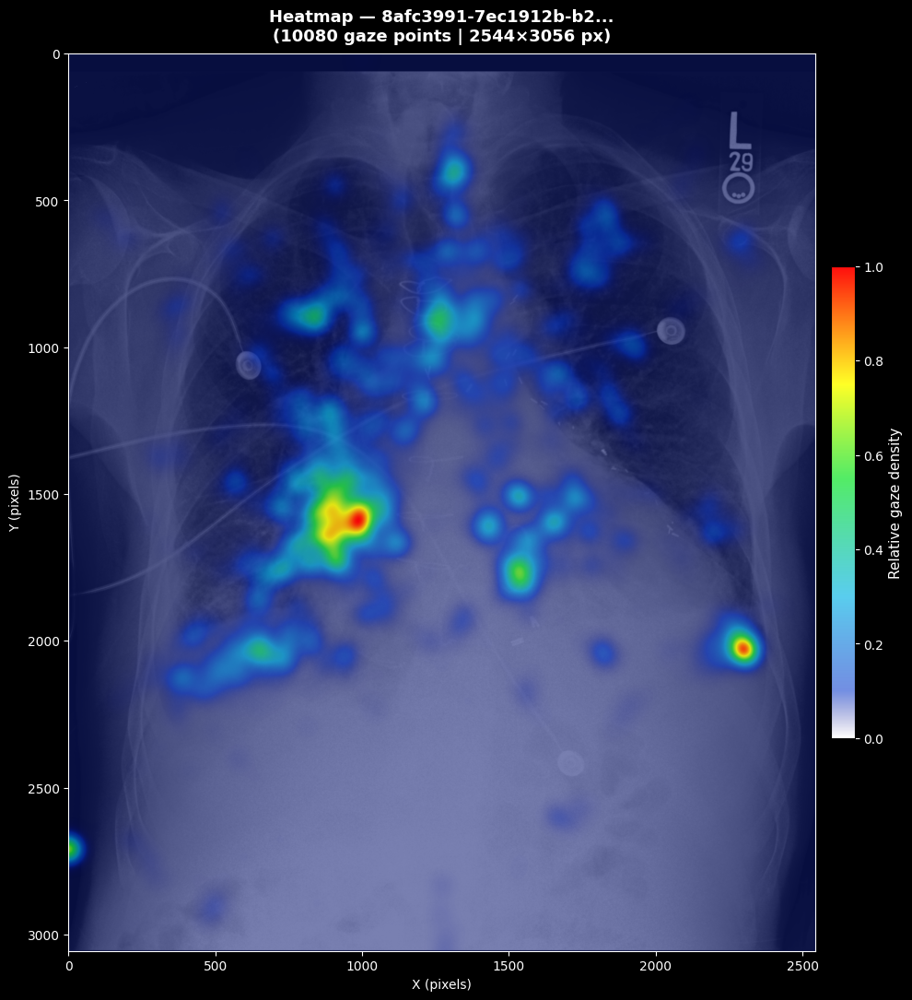

In [8]:
for image_name, info in image_info.items():
    subset = df_px[df_px[COL_IMAGE] == image_name]
    if subset.empty:
        print(f"⚠️  No gaze data for {image_name}")
        continue

    px_vals = subset["px"].values
    py_vals = subset["py"].values
    w, h   = info["width"], info["height"]
    short  = image_name[:20] + "..."   # abbreviated for titles

    save = None
    if OUTPUT_DIR:
        safe = image_name.replace("/", "_")
        save = os.path.join(OUTPUT_DIR, f"{safe}_heatmap.png")

    print(f"\n🔥  Heatmap — {image_name}  ({w}×{h} px, {len(subset)} gaze points)")
    plot_heatmap(
        image_path = info["path"],
        px         = px_vals,
        py         = py_vals,
        width      = w,
        height     = h,
        title      = f"Heatmap — {short}\n({len(subset)} gaze points | {w}×{h} px)",
        sigma      = HEATMAP_SIGMA,
        save_path  = save,
    )

## 8 · Generate Scanpath for Every Image


👁  Scanpath — a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3  (2544×3056 px, 11802 fixations)
    Saved → output_figures\a28cb755-423caf3b-13530617-03aaff16-5ca9a2b3_scanpath.png


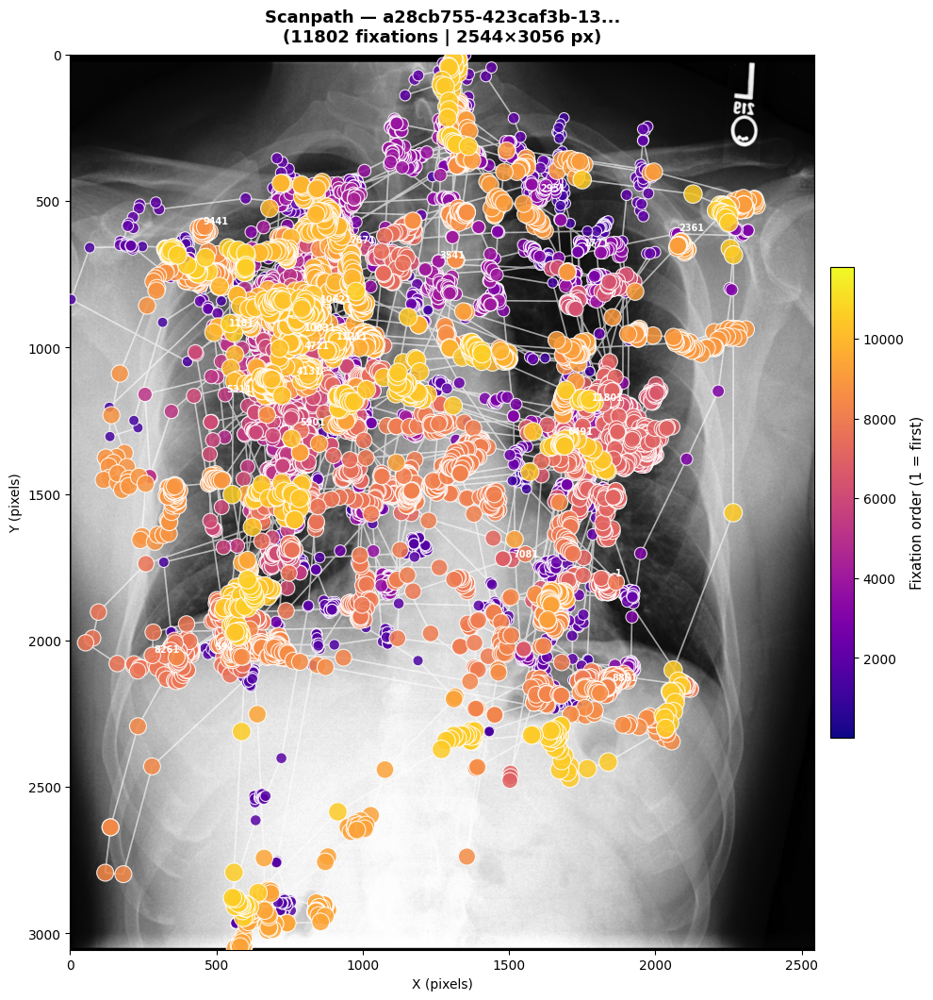


👁  Scanpath — 53ba5a31-2d6bda0a-abb7ad77-065a0f20-b4fa6b44  (3056×2544 px, 14143 fixations)
    Saved → output_figures\53ba5a31-2d6bda0a-abb7ad77-065a0f20-b4fa6b44_scanpath.png


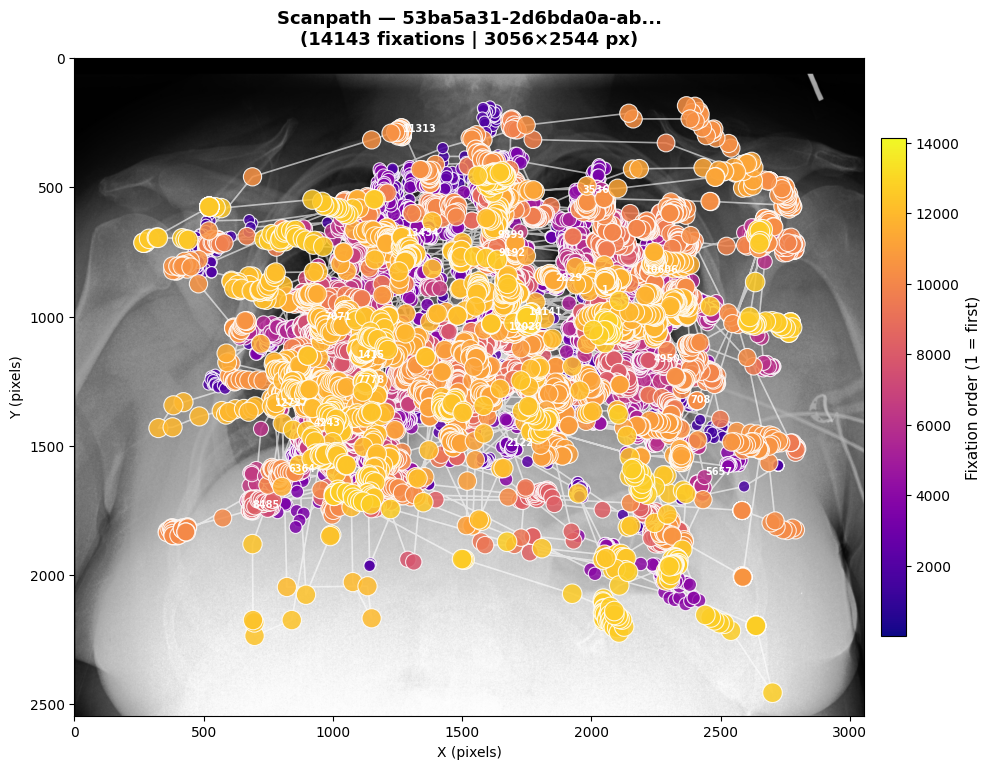


👁  Scanpath — f79f46d3-74a520f1-3039fa3d-eef50e3d-a5ad3e59  (2544×3056 px, 9312 fixations)
    Saved → output_figures\f79f46d3-74a520f1-3039fa3d-eef50e3d-a5ad3e59_scanpath.png


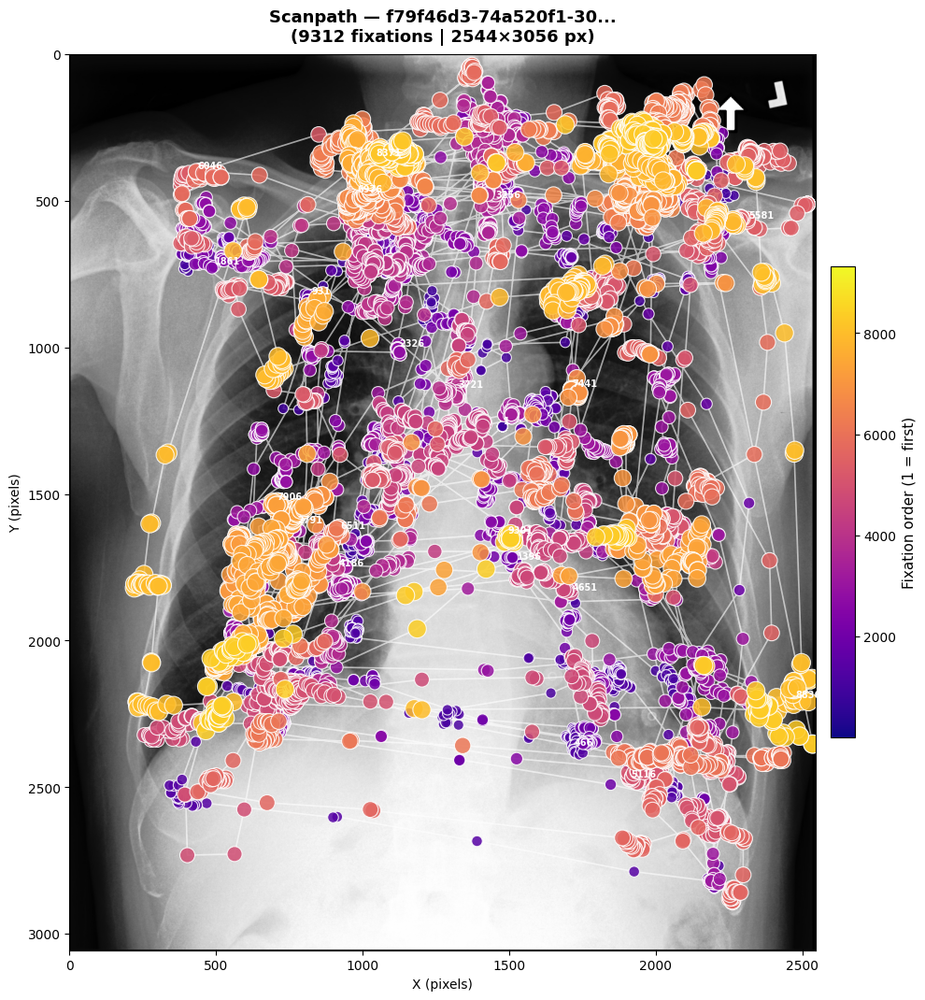


👁  Scanpath — 1793e4df-5b1fd824-cb5d0f43-bc3531f4-40cf6c54  (3056×2544 px, 7957 fixations)
    Saved → output_figures\1793e4df-5b1fd824-cb5d0f43-bc3531f4-40cf6c54_scanpath.png


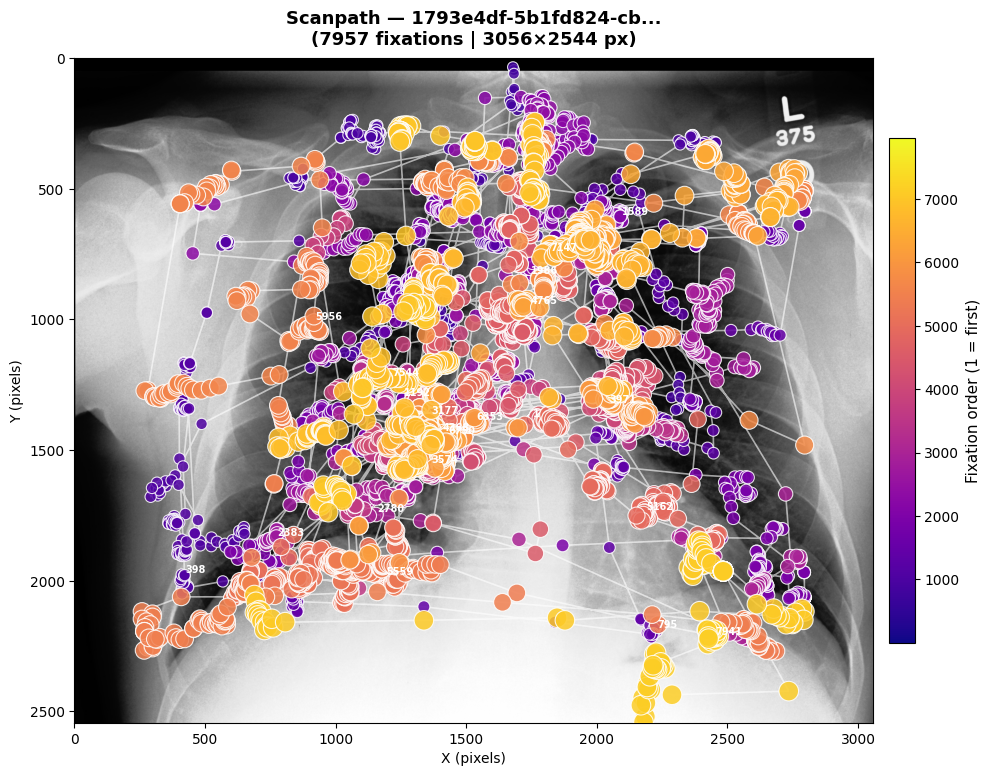


👁  Scanpath — 060cf092-fe76bdf7-19fee515-26cbef2c-5c16ba6f  (1794×2021 px, 14802 fixations)
    Saved → output_figures\060cf092-fe76bdf7-19fee515-26cbef2c-5c16ba6f_scanpath.png


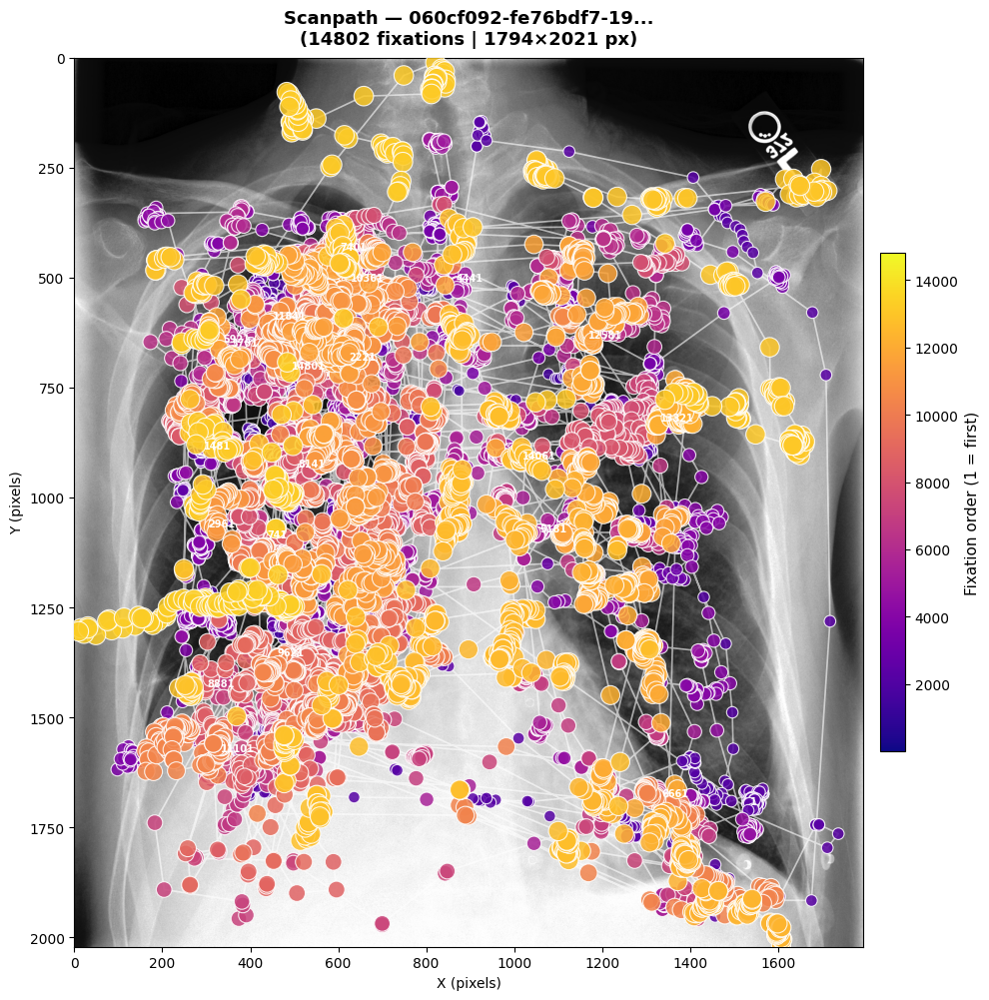


👁  Scanpath — 9c452d99-a2e14f15-8458865f-92178374-a9e29b76  (2544×3056 px, 11412 fixations)
    Saved → output_figures\9c452d99-a2e14f15-8458865f-92178374-a9e29b76_scanpath.png


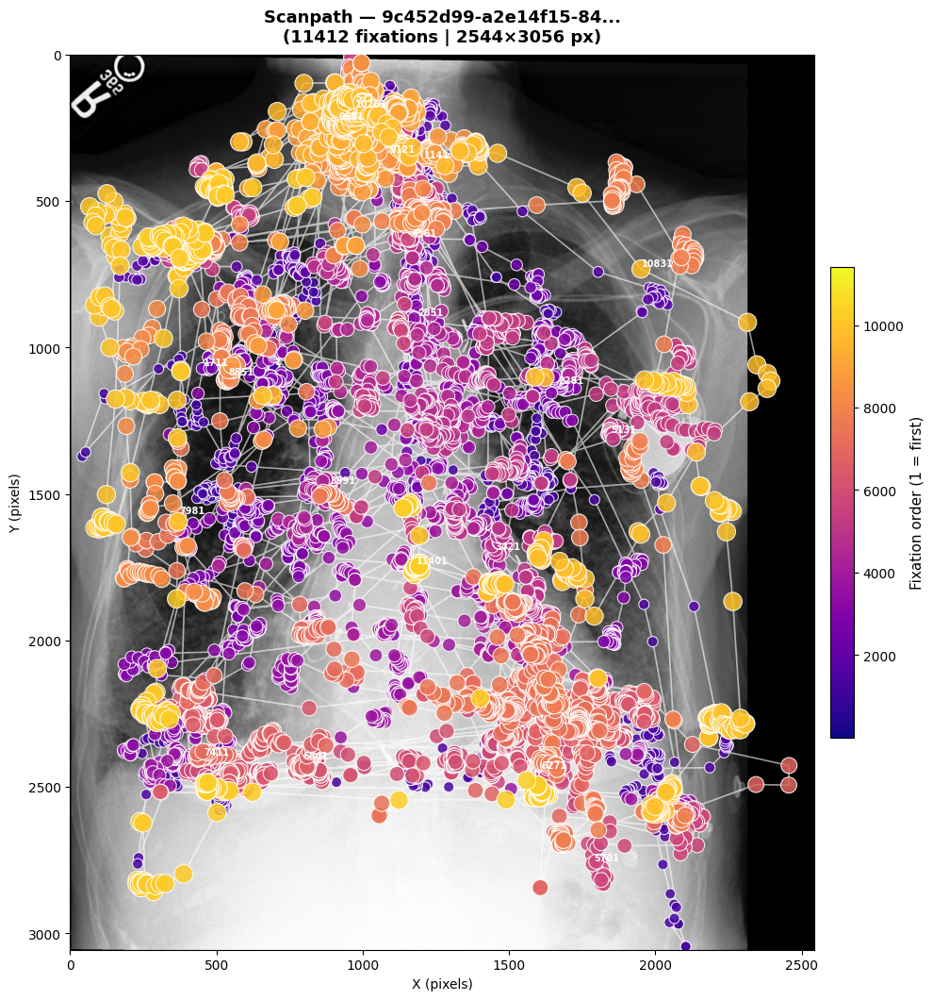


👁  Scanpath — 5c61db80-672e0874-ba236081-53d2f8ad-ab8d2efb  (2544×3056 px, 8206 fixations)
    Saved → output_figures\5c61db80-672e0874-ba236081-53d2f8ad-ab8d2efb_scanpath.png


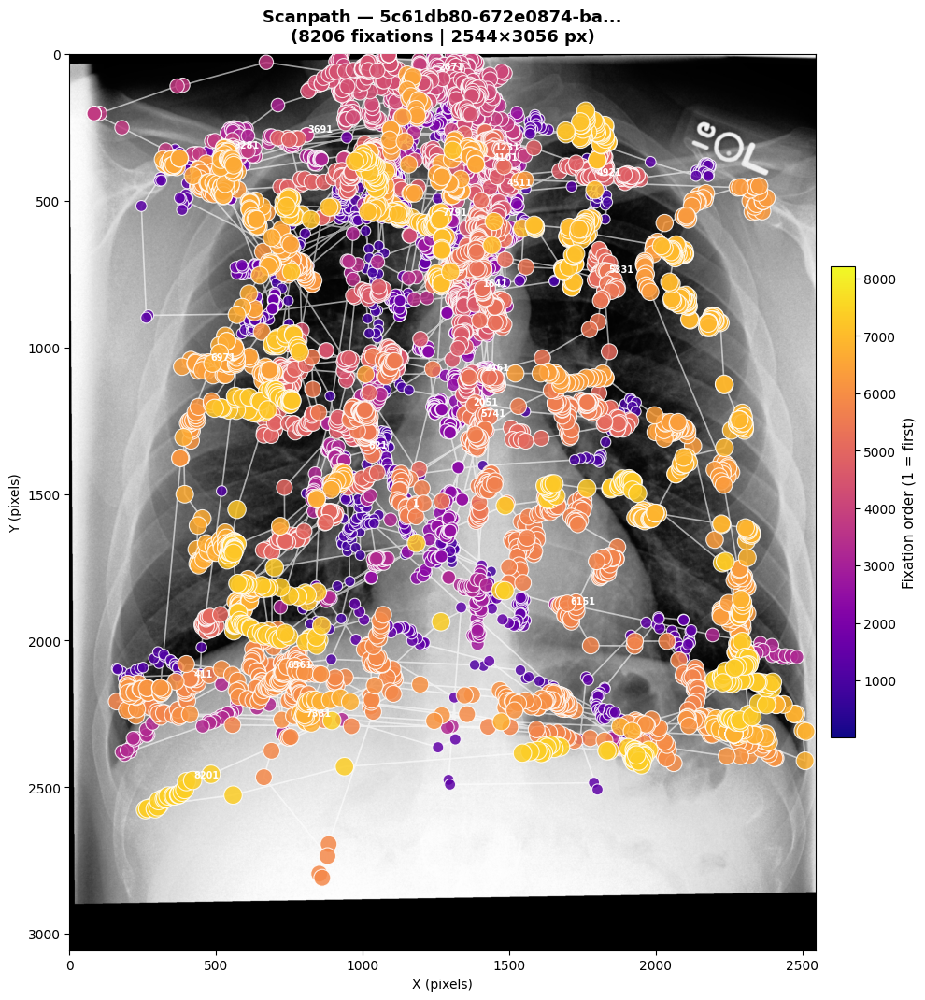


👁  Scanpath — cb1f25ef-87f09c2a-0f656ffe-f63022ab-8b305520  (2544×3056 px, 13714 fixations)
    Saved → output_figures\cb1f25ef-87f09c2a-0f656ffe-f63022ab-8b305520_scanpath.png


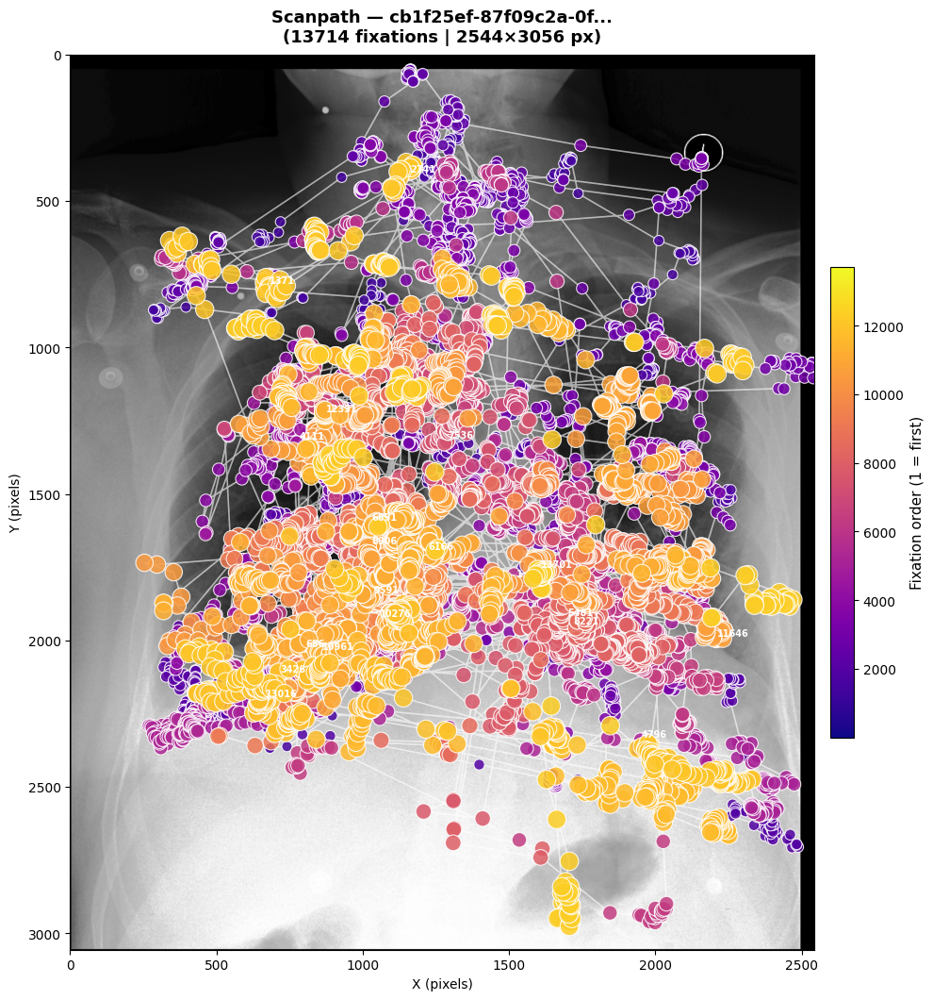


👁  Scanpath — 8afc3991-7ec1912b-b24d9633-3c4b0f57-17c0e8f4  (2544×3056 px, 10080 fixations)
    Saved → output_figures\8afc3991-7ec1912b-b24d9633-3c4b0f57-17c0e8f4_scanpath.png


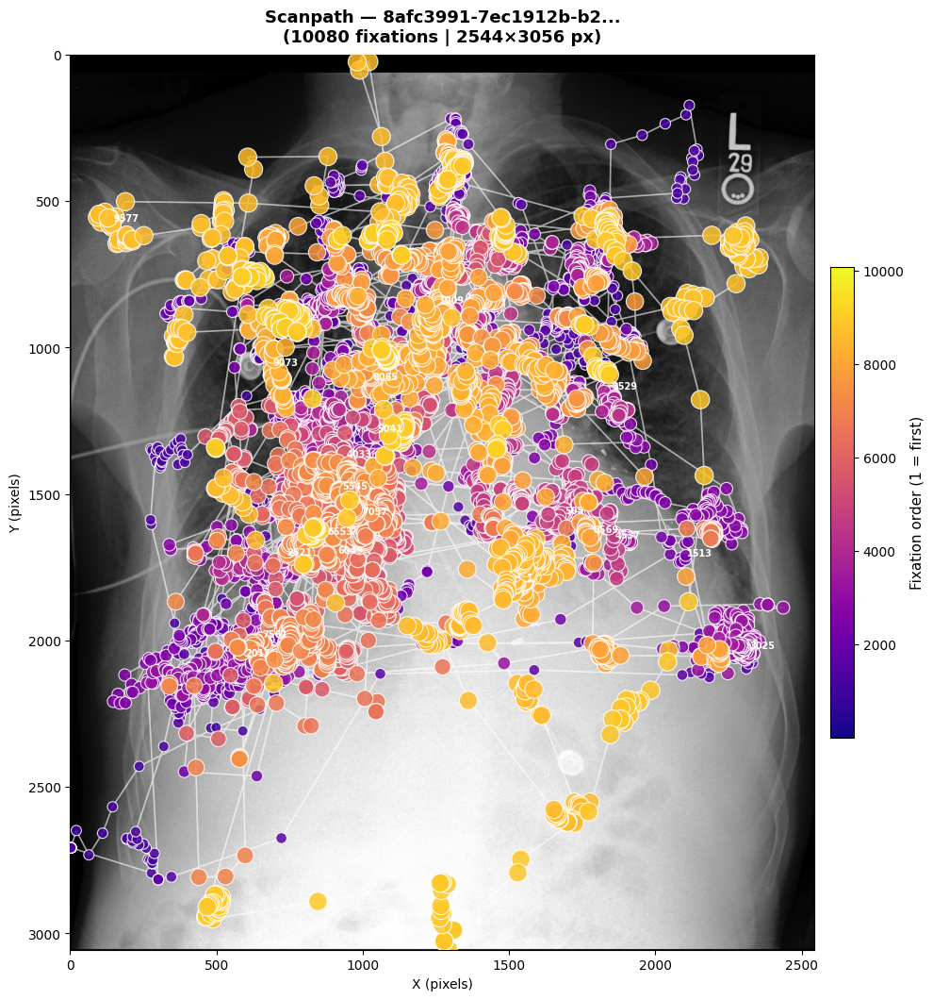

In [9]:
for image_name, info in image_info.items():
    subset = df_px[df_px[COL_IMAGE] == image_name].copy()
    if subset.empty:
        print(f"⚠️  No gaze data for {image_name}")
        continue

    # Sort by time to get correct fixation order
    try:
        subset = subset.sort_values(COL_TIME)
    except Exception:
        pass  # keep original order if sort fails

    px_vals = subset["px"].values
    py_vals = subset["py"].values
    w, h   = info["width"], info["height"]
    short  = image_name[:20] + "..."

    save = None
    if OUTPUT_DIR:
        safe = image_name.replace("/", "_")
        save = os.path.join(OUTPUT_DIR, f"{safe}_scanpath.png")

    print(f"\n👁  Scanpath — {image_name}  ({w}×{h} px, {len(subset)} fixations)")
    plot_scanpath(
        image_path = info["path"],
        px         = px_vals,
        py         = py_vals,
        width      = w,
        height     = h,
        title      = f"Scanpath — {short}\n({len(subset)} fixations | {w}×{h} px)",
        save_path  = save,
    )

## 9 · Summary Statistics

In [10]:
summary = []
for image_name, info in image_info.items():
    subset = df_px[df_px[COL_IMAGE] == image_name]
    summary.append({
        "Image"       : image_name[:40],
        "Width (px)"  : info["width"],
        "Height (px)" : info["height"],
        "Gaze points" : len(subset),
        "X_px mean"   : subset["px"].mean().round(1),
        "Y_px mean"   : subset["py"].mean().round(1),
        "X_px std"    : subset["px"].std().round(1),
        "Y_px std"    : subset["py"].std().round(1),
    })

pd.DataFrame(summary).set_index("Image")

,Width (px),Height (px),Gaze points,X_px mean,Y_px mean,X_px std,Y_px std
Image,,,,,,,
a28cb755-423caf3b-13530617-03aaff16-5ca9,2544,3056,11802,1089.1,1197.9,475.0,539.0
53ba5a31-2d6bda0a-abb7ad77-065a0f20-b4fa,3056,2544,14143,1542.1,1080.2,519.2,351.2
f79f46d3-74a520f1-3039fa3d-eef50e3d-a5ad,2544,3056,9312,1391.6,1222.0,548.1,743.5
1793e4df-5b1fd824-cb5d0f43-bc3531f4-40cf,3056,2544,7957,1598.1,1197.1,523.0,507.1
060cf092-fe76bdf7-19fee515-26cbef2c-5c16,1794,2021,14802,703.6,1018.9,338.3,398.3
9c452d99-a2e14f15-8458865f-92178374-a9e2,2544,3056,11412,1167.6,1312.9,461.3,822.4
5c61db80-672e0874-ba236081-53d2f8ad-ab8d,2544,3056,8206,1277.3,914.3,441.5,686.5
cb1f25ef-87f09c2a-0f656ffe-f63022ab-8b30,2544,3056,13714,1316.5,1648.7,493.2,522.9
8afc3991-7ec1912b-b24d9633-3c4b0f57-17c0,2544,3056,10080,1165.1,1406.8,483.0,495.1


---
## Tips & Customisation

| Parameter | Where | Effect |
|-----------|-------|--------|
| `HEATMAP_SIGMA` | Cell 1 | Blur radius in pixels — bigger = smoother blobs |
| `HEATMAP_CMAP` | Cell 6 | Colour ramp — edit the colour stops |
| `SCANPATH_MIN/MAX_DOT` | Cell 1 | Dot size range |
| `alpha=0.65` in `plot_heatmap` | Cell 6 | Heatmap transparency (0 = invisible, 1 = opaque) |
| `label_step` in `plot_scanpath` | Cell 6 | How often fixation numbers are printed |
| `OUTPUT_DIR` | Cell 1 | Set to a folder path to auto-save figures |
